### Library loading

In [1]:
import scanpy as sc, anndata as ad, numpy as np, pandas as pd, seaborn as sns
from scipy import sparse
from anndata import AnnData
from matplotlib import pylab
import warnings
import scanpy.external as sce
import socket
import matplotlib.pyplot as plt

import yaml
import os
import scvelo as scv

warnings.filterwarnings('ignore')

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.22.2 scipy==1.6.2 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.9.1 louvain==0.7.0 leidenalg==0.8.3
figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


In [8]:
plt.rcParams["savefig.dpi"] = 300

### Configure paths

In [3]:
outdir = "../data/output"

with open("../data/resources/iPSC_lines_map.yaml", 'r') as f:
    iPSC_lines_map = yaml.load(f, Loader=yaml.FullLoader)["lines"]
colorsmap = dict(zip([i["newName"] for i in iPSC_lines_map.values()],[i["color"] for i in iPSC_lines_map.values()]))

# Import anndata_all

In [4]:
adata = sc.read_h5ad(outdir+"/adatas/ClusterAnnotated_Base_filt.h5ad")

# Markers plot

In [5]:
mPlotList = ["CDC20","MKI67","TOP2A","VIM","SOX2","NES","AQP4",
            "S100B","HOPX","CBLN1","RELN","PAX6","EOMES","TAGLN3","FOXP1",
            "CA8","LHX1","SLC17A6","NOVA1","SATB2","SLC17A7","GRIA2", "DCX", 
             "BCL11B", "TUBB3", "MAP2", "NEUROD1",
            "GAD2","DLX5","DLX6-AS1","EOMES"]

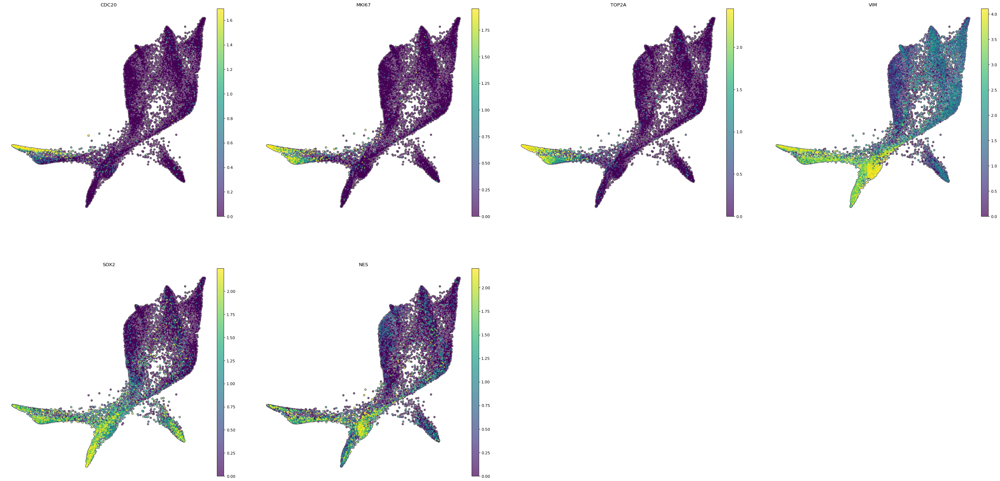

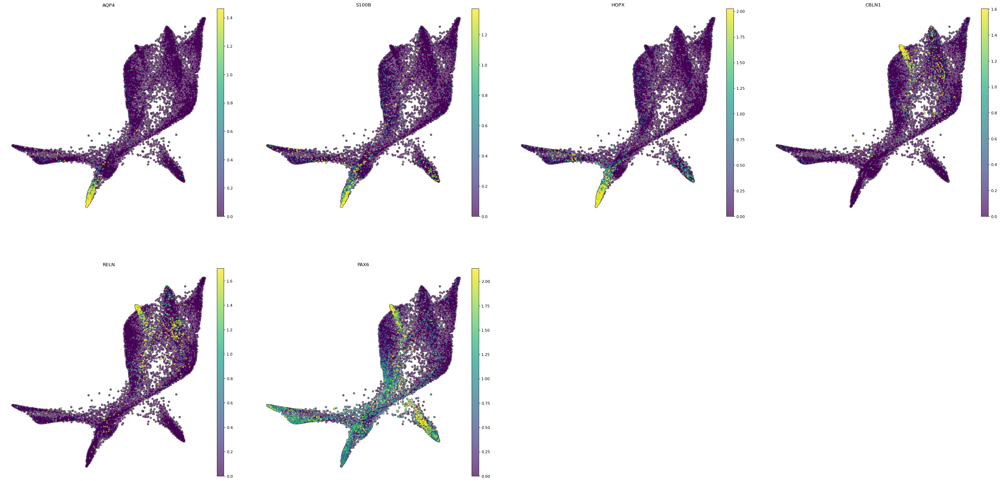

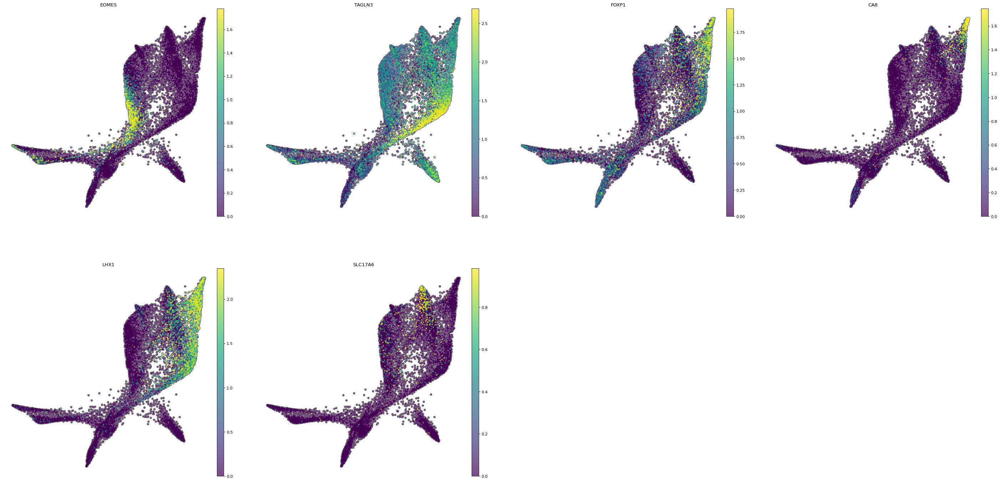

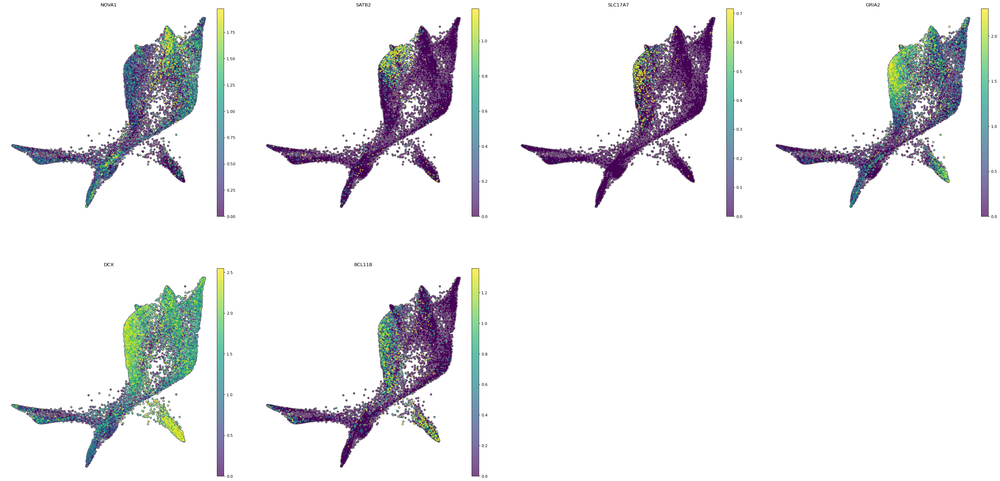

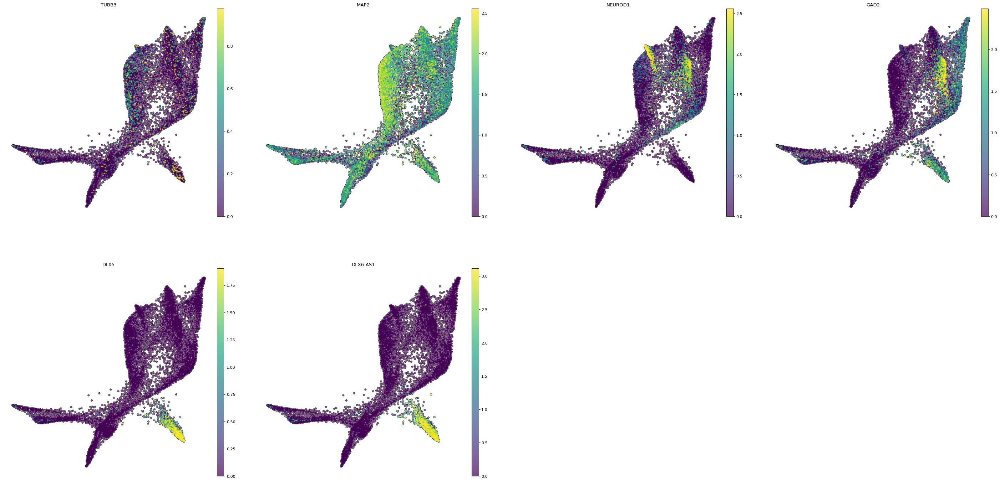

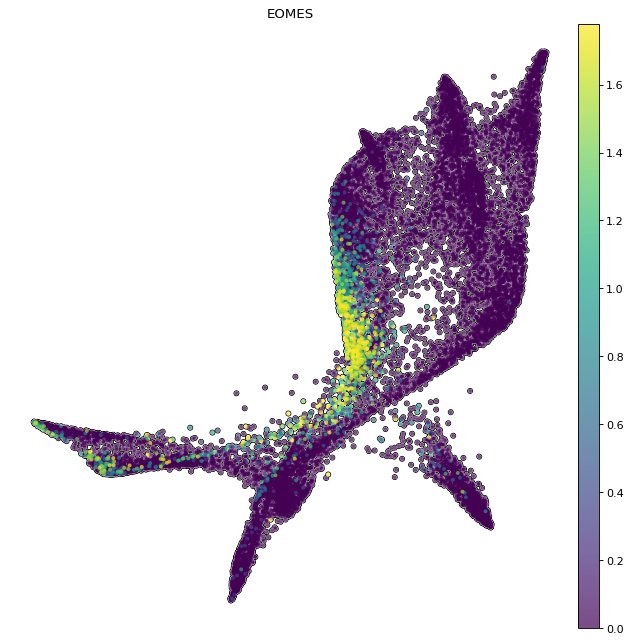

In [16]:
import matplotlib

sc.settings._vector_friendly = True

Split=5
for mlist in enumerate([mPlotList[(len(mPlotList)//Split)*i : (len(mPlotList)//Split)*(i+1) ] for i in list(range(Split))]+[mPlotList[-(len(mPlotList)%Split):]]):
    sc.pl.draw_graph(adata, color=mlist[1], size = 50, add_outline = True,outline_width=(0.2, 0.05),vmin="p1",vmax="p99", frameon=False,  save="markers."+str(mlist[0])+".svg")

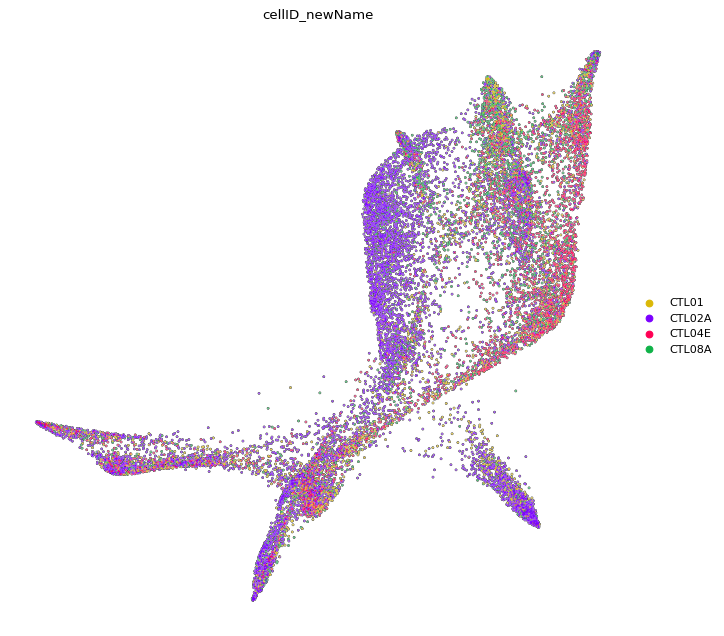

In [8]:
sc.pl.draw_graph(adata, color="cellID_newName", size = 10, add_outline = True,outline_width=(0.2, 0.05),vmin="p1",vmax="p99", frameon=False, save = ".genotype.svg")

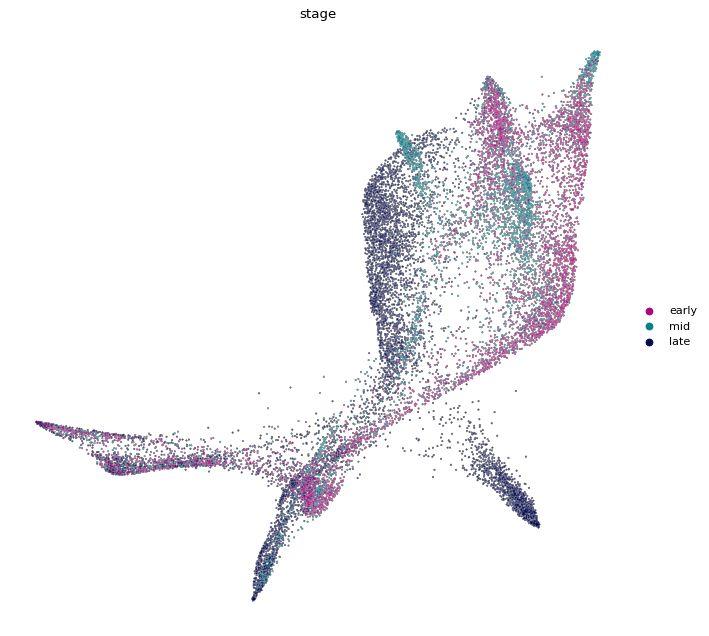

In [9]:
sc.pl.draw_graph(adata, color="stage", size = 7, add_outline = True,outline_width=(0.1, 0.05),vmin="p1",vmax="p99", frameon=False,  save= ".stage.svg")

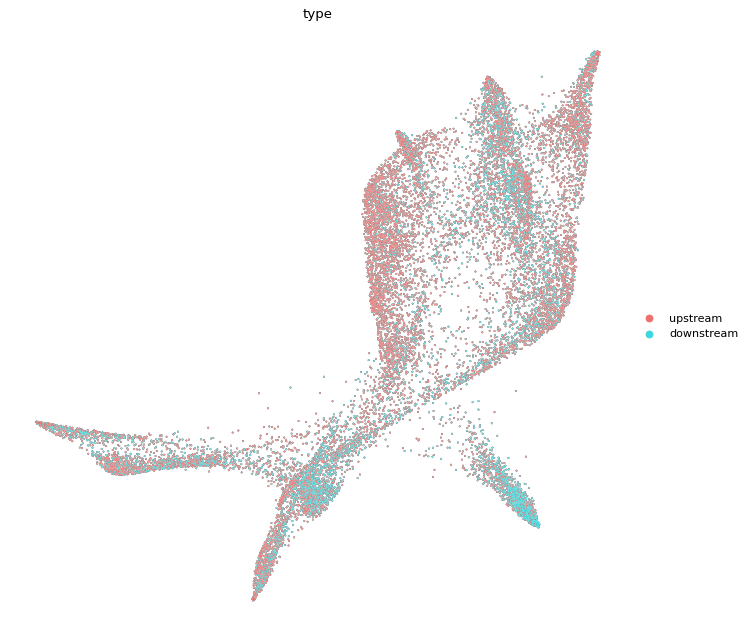

In [10]:
sc.pl.draw_graph(adata, color="type", size = 7, add_outline = True,outline_width=(0.1, 0.05),vmin="p1",vmax="p99", frameon=False,  save="type.svg")

figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


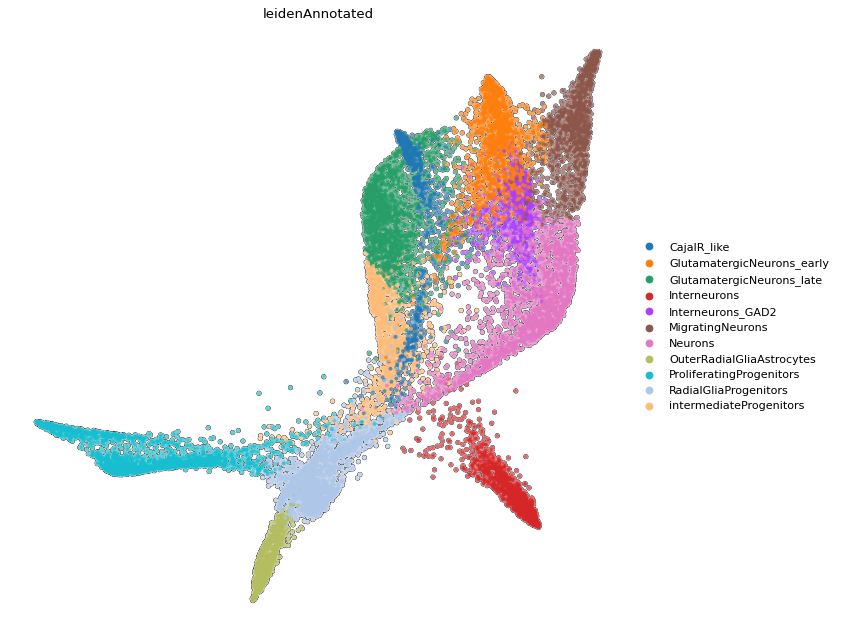

In [11]:
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))
sc.pl.draw_graph(adata, color="leidenAnnotated", size = 50,add_outline = True,outline_width=(0.1, 0.05),vmin="p1",vmax="p99", frameon=False,  save="leiden.png")

# Plot markers dotplot

In [12]:
pylab.rcParams['figure.figsize']

[10.0, 10.0]

In [13]:
LeidenOrder = ['ProliferatingProgenitors', 
               'RadialGliaProgenitors',
               'OuterRadialGliaAstrocytes',
               'CajalR_like',
               'intermediateProgenitors',
                'Neurons', 
               'MigratingNeurons',
               'GlutamatergicNeurons_early',
               'GlutamatergicNeurons_late', 
               'Interneurons_GAD2',
               'Interneurons']                                


In [14]:
adata.raw.to_adata().X.data

array([0.57579654, 0.57579654, 0.57579654, ..., 2.5117002 , 1.3814054 ,
       1.7524617 ], dtype=float32)

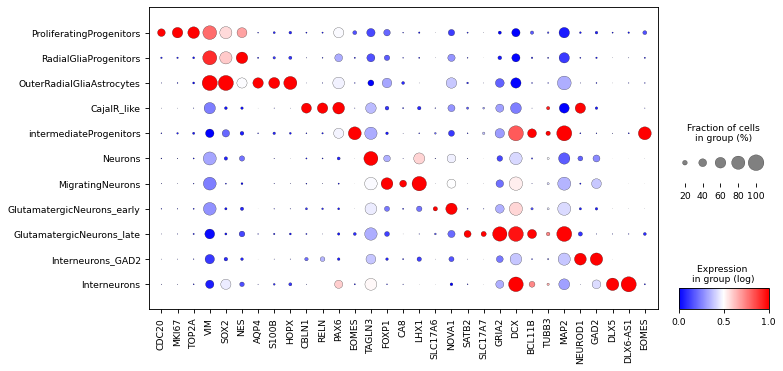

In [15]:

sc.pl.dotplot(adata, mPlotList, 'leidenAnnotated', figsize = [10,5], categories_order = LeidenOrder, cmap="bwr", standard_scale="var",  save="dotplotMarkers.svg", colorbar_title = "Expression \nin group (log)")



In [16]:
with open("../data/resources/rcParams.yaml") as f:
    rcParamsDict = yaml.full_load(f)
    for k in rcParamsDict["rcParams"]:
        print("{} {}".format(k,rcParamsDict["rcParams"][k]))
        plt.rcParams[k] = rcParamsDict["rcParams"][k]
    for k1 in set(list(rcParamsDict)).difference(set(["rcParams"])):
        print("{} {}".format(k1,rcParamsDict[k1]))

figure.dpi 80
savefig.dpi 500
figure.figsize [10, 10]
axes.facecolor None
figure.facecolor None
dotSize 20


In [17]:
import random
groupedOBS = adata.obs.groupby(["type","stage"],as_index=False).size()
SamplingBCs = []
for tpt in groupedOBS.stage.unique():
    adataSlice = adata[adata.obs["stage"] == tpt]
    minCells = groupedOBS.loc[groupedOBS.stage == tpt,"size"].min()

    SampledCells = [random.sample(adataSlice[adataSlice.obs["type"] == i].obs_names.tolist(),minCells)  for i in adataSlice.obs["type"].unique()]
    SamplingBCs.extend([item for sublist in SampledCells for item in sublist])
    
adataSlice = adata[SamplingBCs]

pd.crosstab(adataSlice.obs["stage"],adataSlice.obs["type"])

type,upstream,downstream
stage,,
early,2034,2034
mid,1522,1522
late,1771,1771


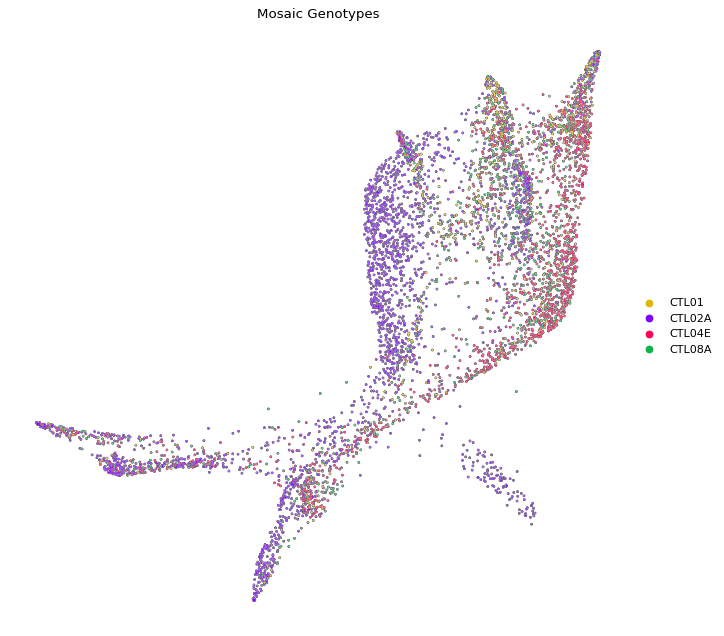

In [18]:
sc.pl.draw_graph(adataSlice[adataSlice.obs["type"] == "upstream"], color="cellID_newName", size = 10, title="Mosaic Genotypes",
               add_outline = True,outline_width=(0.2, 0.05),vmin="p1",vmax="p99", frameon=False, ncols=2)

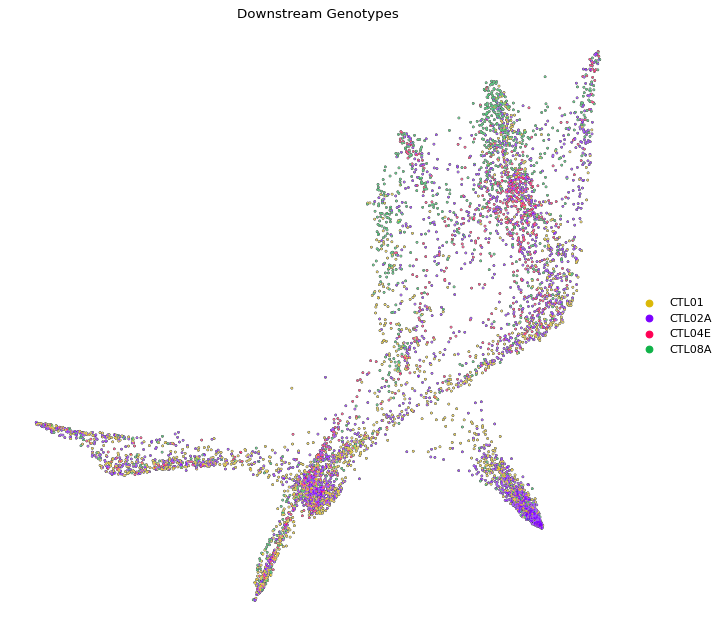

In [19]:
sc.pl.draw_graph(adataSlice[adataSlice.obs["type"] == "downstream"], color="cellID_newName", size = 10, title="Downstream Genotypes",
               add_outline = True,outline_width=(0.2, 0.05),vmin="p1",vmax="p99", frameon=False, ncols=2)

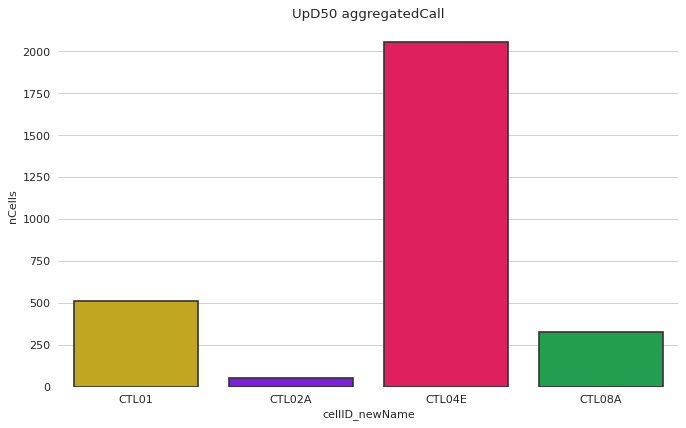

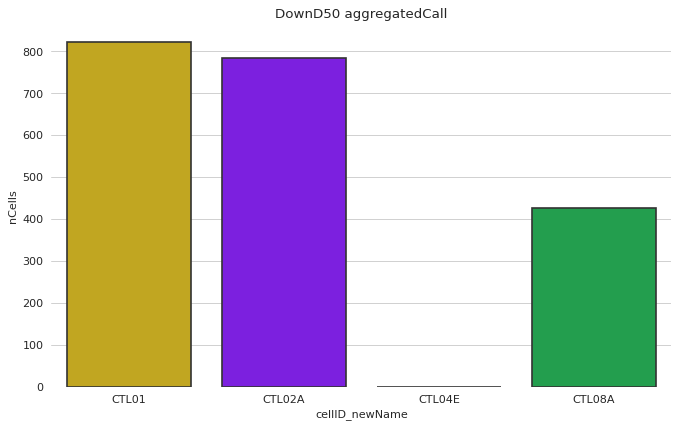

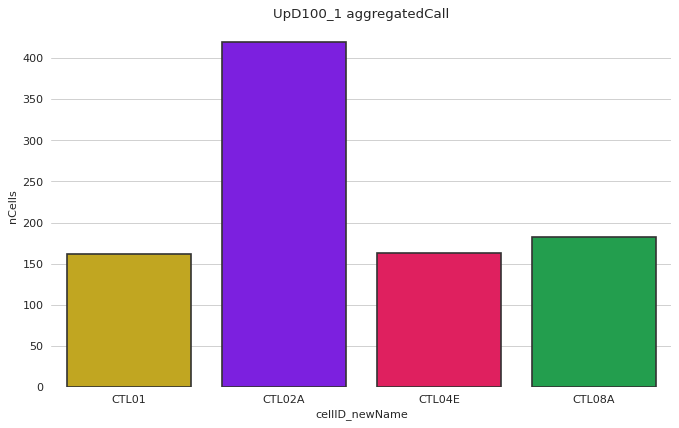

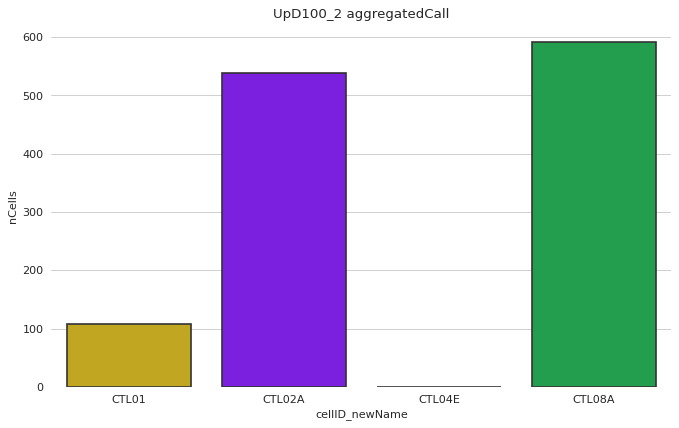

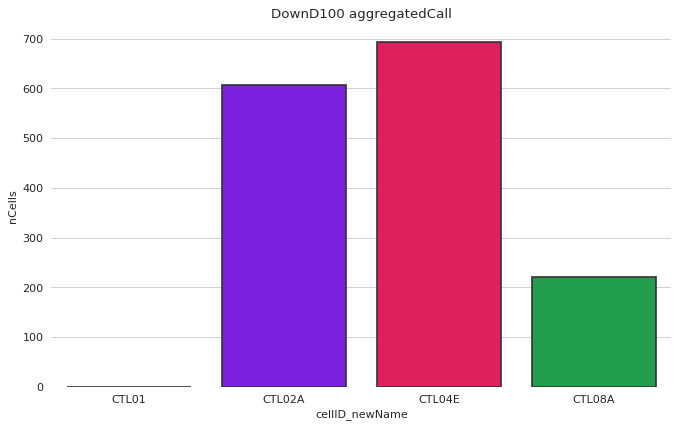

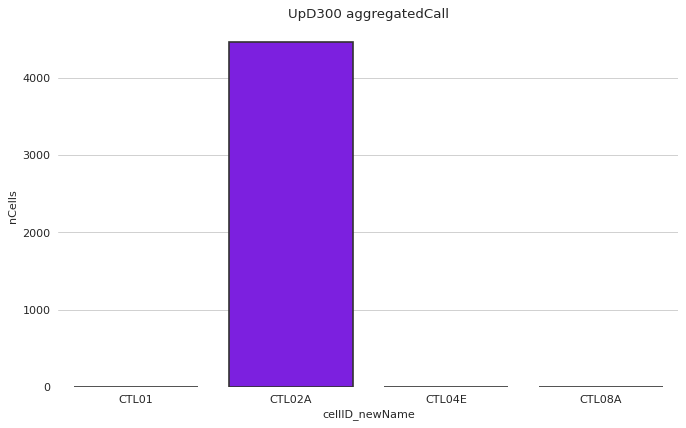

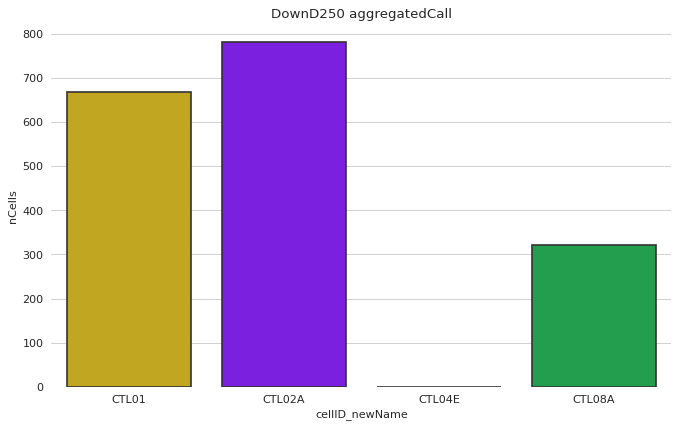

In [20]:
AllAggregatedgrouped = adata.obs[["dataset","cellID_newName"]].groupby(["dataset","cellID_newName"], as_index=False).size()
AllAggregatedgrouped.loc[:,"paradigm"] = "upstream"
AllAggregatedgrouped.loc[AllAggregatedgrouped["dataset"].isin(["D100Down","D250Down","D50Down"]),"paradigm"] = "downstream"
AllAggregatedgrouped.loc[:,"stage"] = "mid"
AllAggregatedgrouped.loc[AllAggregatedgrouped["dataset"].isin(["D50Down","D50Up"]),"stage"] = "early"
AllAggregatedgrouped.loc[AllAggregatedgrouped["dataset"].isin(["D250Down","D300Up"]),"stage"] = "late"
AllAggregatedgrouped.rename(columns={"Consensus":"cellID_newName","size":"nCells"}, inplace=True)
AllAggregatedgrouped.head()


for ds in list(AllAggregatedgrouped.dataset.unique()):
    sns.set_style("whitegrid")

    localDF = AllAggregatedgrouped[AllAggregatedgrouped["dataset"] == ds]
    localDF["cellID_newName"] = localDF["cellID_newName"].astype("category")
    localDF["cellID_newName"] = localDF["cellID_newName"].cat.set_categories([iPSC_lines_map[k]["newName"] for k in list(iPSC_lines_map.keys()) if iPSC_lines_map[k]["newName"] in localDF["cellID_newName"].tolist()], ordered = True)

    plt.figure(figsize=(10, 6))
    fig = sns.barplot(x="cellID_newName", y="nCells",linewidth=1.5,edgecolor=".2", data=localDF, order=adata.obs.cellID_newName.cat.categories.tolist(),
                      palette=colorsmap).set(title=ds+" aggregatedCall")
    sns.despine(left=True, bottom=True)

    fig.clear
    